In [1]:
from typing import List

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

os.makedirs("figs/", exist_ok=True)

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 24
plt.rcParams['mathtext.fontset'] = 'stix'  # The setting of math font

In [2]:
config_table = pd.read_csv("results-bandwidth/setting-table.csv", index_col=0)
assert len(config_table) == 288 + 1

mean_vals = pd.read_csv("results-bandwidth/mean_vals.csv")
OPTUNA_INDEX = config_table[config_table.alpha.isna()].index.tolist()
optuna_vals = mean_vals[np.any([mean_vals.setting_index == idx for idx in OPTUNA_INDEX], axis=0)]
mean_vals = mean_vals[np.all([mean_vals.setting_index != idx for idx in OPTUNA_INDEX], axis=0)]

target_names = mean_vals.target.unique()
target_cols = mean_vals.target
target_names

array(['Perm_10d', 'Schwefel_05d', 'Rosenbrock_10d', 'Rastrigin_30d',
       'KTablet_10d', 'Sphere_05d', 'Rosenbrock_30d',
       'WeightedSphere_10d', 'WeightedSphere_30d', 'cifar10',
       'Styblinski_10d', 'Ackley_30d', 'parkinsons_telemonitoring',
       'Levy_30d', 'XinSheYang_30d', 'Sphere_10d', 'Griewank_05d',
       'Ackley_10d', 'car', 'Levy_05d', 'Sphere_30d', 'segment',
       'Griewank_10d', 'naval_propulsion', 'KTablet_05d', 'phoneme',
       'Styblinski_30d', 'Rosenbrock_05d', 'Schwefel_30d', 'Perm_30d',
       'XinSheYang_05d', 'credit_g', 'XinSheYang_10d', 'fashion_mnist',
       'australian', 'Rastrigin_05d', 'blood_transfusion', 'Perm_05d',
       'Rastrigin_10d', 'WeightedSphere_05d', 'Ackley_05d', 'vehicle',
       'kc1', 'colorectal_histology', 'KTablet_30d', 'Griewank_30d',
       'Schwefel_10d', 'Levy_10d', 'Styblinski_05d', 'slice_localization',
       'protein_structure'], dtype=object)

In [3]:
rec_vals = {
    "multivariate": True,
    "quantile": "sqrt",
    "alpha": 1.0,
    "weight": "older-smaller",
    "magic-clip": True,
    "min_bandwidth_factor": 0.01,
    "heuristic": "scott",
}

mask = np.ones(len(config_table), dtype=np.bool8)
for k, v in rec_vals.items():
    mask &= (config_table[k] == v)

recommended_setting_results = mean_vals[mean_vals["setting_index"] == config_table[mask].index[0]]
recommended_setting_results.head(10)

,setting_index,target,n_evals001,n_evals002,n_evals003,n_evals004,n_evals005,n_evals006,n_evals007,n_evals008,...,n_evals191,n_evals192,n_evals193,n_evals194,n_evals195,n_evals196,n_evals197,n_evals198,n_evals199,n_evals200
12444,244,Perm_10d,1241.205300,837.171800,578.951300,380.117100,376.074300,342.330780,271.188050,252.204200,...,11.410031,11.410031,11.410031,11.410031,11.410031,11.410031,11.410031,11.410031,10.662237,10.662237
12445,244,Schwefel_05d,-164.090160,-238.209550,-395.460420,-543.112730,-543.112730,-596.721400,-631.004940,-660.139600,...,-1458.231400,-1458.231400,-1458.231400,-1458.231400,-1458.231400,-1458.231400,-1458.231400,-1458.231400,-1458.231400,-1493.459100
12446,244,Rosenbrock_10d,133702.750000,103194.445000,87042.766000,69044.970000,58985.900000,57357.473000,57071.477000,47509.550000,...,544.062400,544.062400,544.062400,544.062400,544.062400,544.062400,544.062400,531.246800,531.246800,531.246800
12447,244,Rastrigin_30d,536.319900,504.728270,475.891750,470.693150,467.816860,463.631930,463.631930,463.631930,...,302.638240,302.638240,302.638240,302.638240,302.638240,302.638240,302.638240,302.638240,302.638240,302.638240
12448,244,KTablet_10d,506546.300000,454820.030000,432131.700000,386422.030000,366056.400000,359606.970000,357915.780000,328892.880000,...,16393.094000,16077.435000,16077.435000,15035.268000,14739.360000,14739.360000,14739.360000,14739.360000,14739.360000,14739.360000
12449,244,Sphere_05d,42.867767,24.851173,23.634754,21.118855,20.747738,18.992445,16.790731,13.688842,...,0.205942,0.205942,0.205942,0.205942,0.205942,0.205942,0.205942,0.205942,0.205942,0.205942
12450,244,Rosenbrock_30d,411573.800000,315497.900000,271465.440000,259475.400000,250960.300000,250960.300000,250960.300000,250960.300000,...,17152.945000,17152.945000,17152.945000,17152.945000,17127.734000,16886.459000,16886.459000,16546.830000,16546.830000,16546.830000
12451,244,WeightedSphere_10d,375.418370,337.641500,316.264300,285.383820,270.530120,269.005000,268.109000,240.586850,...,18.881107,17.518538,17.518538,17.518538,16.703478,16.703478,16.703478,16.703478,16.703478,16.703478
12452,244,WeightedSphere_30d,4097.425300,3284.788300,2932.158200,2866.491200,2866.491200,2703.949000,2703.949000,2703.949000,...,477.438300,477.438300,477.438300,477.438300,466.219020,461.026820,461.026820,461.026820,460.361050,460.361050
12453,244,cifar10,28.923738,17.543901,15.906519,15.141233,14.790152,14.692209,14.439924,13.664784,...,8.402537,8.402537,8.402537,8.402537,8.402537,8.402537,8.402537,8.402537,8.402537,8.402537


In [4]:
def add_optuna_legend(ax: plt.Axes, bbox_to_anchor):
    lines = [
        ax.plot([-1, -1], [-1, -1], color="brown", linestyle="dashed", lw=3)[0],
        ax.plot([-1, -1], [-1, -1], color="black", linestyle="dotted", lw=3)[0]
    ]
    labels = ["Optuna v3.1.0", "Recommended"]
    ax.legend(
        handles=lines,
        loc="upper center",
        labels=labels,
        bbox_to_anchor=bbox_to_anchor,  # ここは調整が必要です
        fancybox=False,
        shadow=False,
        ncol=len(labels),
        fontsize=48,
    )

In [5]:
MV_CONDS = (config_table.multivariate == True, config_table.multivariate == False)
MV_LABELS = ("Multivariate", "Univariate")
MV_TITLE = "Multivariate"

HEURISTIC_CONDS = (
    config_table.heuristic == "scott",
    config_table.heuristic == "hyperopt",
    config_table.heuristic == "optuna",
)
HEURISTIC_LABELS = ("Scott", "Hyperopt", "Optuna")
HEURISTIC_TITLE = "Bandwidth Heuristic"

MAGIC_CLIP_CONDS = (config_table["magic-clip"] == True, config_table["magic-clip"] == False)
MAGIC_CLIP_LABELS = ("With", "Without")
MAGIC_CLIP_TITLE = "Magic clipping"

W_CONDS = (
    config_table.weight=="uniform",
    config_table.weight=="older-smaller",
)
W_LABELS = ("Uniform", "Old decay")
W_TITLE = "Weighting algorithm"

GAMMA_CONDS = (
    (config_table["quantile"]=="linear") & (config_table.alpha==0.15),
    (config_table["quantile"]=="sqrt") & (config_table.alpha==0.25),
    (config_table["quantile"]=="sqrt") & (config_table.alpha==1.0),
)
GAMMA_LABELS = ("Linear, $0.15$", "Sqrt, $0.25$", "Sqrt, $1.0$")
GAMMA_TITLE = "Splitting algorithm"

BW_CONDS = (
    (config_table["min_bandwidth_factor"] == 0.01),
    (config_table["min_bandwidth_factor"] == 0.03),
    (config_table["min_bandwidth_factor"] == 0.1),
    (config_table["min_bandwidth_factor"] == 0.3),
)
BW_LABELS= ("0.01", "0.03", "0.1", "0.3")
BW_TITLE = "$b_{\min}$"

COLORS2 = ("red", "blue")
COLORS3 = ("red", "blue", "cyan")
COLORS4 = ("red", "lime", "cyan", "blue")

In [6]:
from typing import Optional, Tuple
from parzen_estimator import NumericalParzenEstimator


def plot_pdp(
    ax: plt.Axes,
    target_name: str,
    masks: Tuple[np.ndarray],
    colors: Tuple[str],
    title: Optional[str],
    labels: Optional[Tuple[str]],
):
    target_mean = mean_vals[target_cols == target_name]
    optuna_means = optuna_vals[optuna_vals.target == target_name]
    X = np.arange(200) + 1
    alpha = 0.2
    lw_weak, lw = 1, 3
    ymin = min(target_mean["n_evals200"].min(), optuna_means["n_evals200"].min()) - 1e-12
    ymax = max(target_mean["n_evals010"].max(), optuna_means["n_evals010"].max()) + 1e-12

    checkpoints = [50, 100, 150, 200]
    buffer = 0
    labels = labels if labels is not None else [None for _ in range(len(colors))]
    for color, mask, label in zip(colors, masks, labels):
        pdp = np.zeros(200)
        cnt = 0
        ys = {p: [] for p in checkpoints}
        for idx in config_table[mask].index:
            try:
                m = target_mean[target_mean.setting_index == idx].iloc[0].to_numpy()[2:].astype(np.float32)
                # ax.scatter(X[::25], m[::25], alpha=alpha, color=color, s=3)
                for p in checkpoints:
                    ys[p].append(m[p - 1])

                pdp += m
                cnt += 1
            except IndexError:
                pass
        else:
            pdp /= cnt
            ax.plot(X, pdp, color=color, lw=lw, label=label)
            dy = np.linspace(ymin, ymax, 100)
            R = ymax - ymin
            pdf_vals = {
                p: NumericalParzenEstimator(samples=np.asarray(ys[p]), lb=ymin-R, ub=ymax+R, prior=False)(dy)
                for p in checkpoints
            }
            height = 1
            for p in checkpoints:
                pdf_val = pdf_vals[p]
                # 1 / (ymax - ymin) ==> 5
                # 5 * (ymax - ymin)
                S = height * (ymax - ymin)
                ax.fill_betweenx(dy, p - pdf_val * S - buffer, p - buffer, color=color, alpha=alpha)
            else:
                buffer += 6

    # Optuna plot
    m = optuna_means.iloc[0].to_numpy()[2:]
    ax.plot(X, m, color="brown", linestyle="dashed", lw=lw)
    try:
        # recommended
        m = recommended_setting_results[recommended_setting_results.target == target_name].iloc[0].to_numpy()[2:].astype(np.float32)
        ax.plot(X, m, color="black", linestyle="dotted", lw=lw)
    except:
        pass

    if title is not None:
        ax.set_title(title, fontsize=48)
    if labels[0] is not None:
        ax.legend(loc="upper right")

    ax.set_xlim(1, 200)
    ax.set_ylim(ymin, ymax)
    ax.grid()


def plot_multiple_pdps(
    axes: Tuple[plt.Axes],
    target_name: str,
    set_title: bool,
    set_label: bool,
):
    for ax, masks, colors, labels, title in zip(
        axes,
        [MV_CONDS, MAGIC_CLIP_CONDS, GAMMA_CONDS, W_CONDS, HEURISTIC_CONDS, BW_CONDS],
        [COLORS2, COLORS2, COLORS3, COLORS2, COLORS3, COLORS4],
        [MV_LABELS, MAGIC_CLIP_LABELS, GAMMA_LABELS, W_LABELS, HEURISTIC_LABELS, BW_LABELS],
        [MV_TITLE, MAGIC_CLIP_TITLE, GAMMA_TITLE, W_TITLE, HEURISTIC_TITLE, BW_TITLE],
    ):  # TODO: from here
        title = title if set_title else None
        labels = labels if set_label else None
        plot_pdp(ax=ax, target_name=target_name, masks=masks, colors=colors, title=title, labels=labels)

## Benchmark functions

['Ackley', 'Levy', 'Perm', 'Styblinski', 'Rosenbrock', 'Rastrigin', 'XinSheYang', 'Schwefel', 'Sphere', 'Griewank', 'KTablet', 'WeightedSphere']


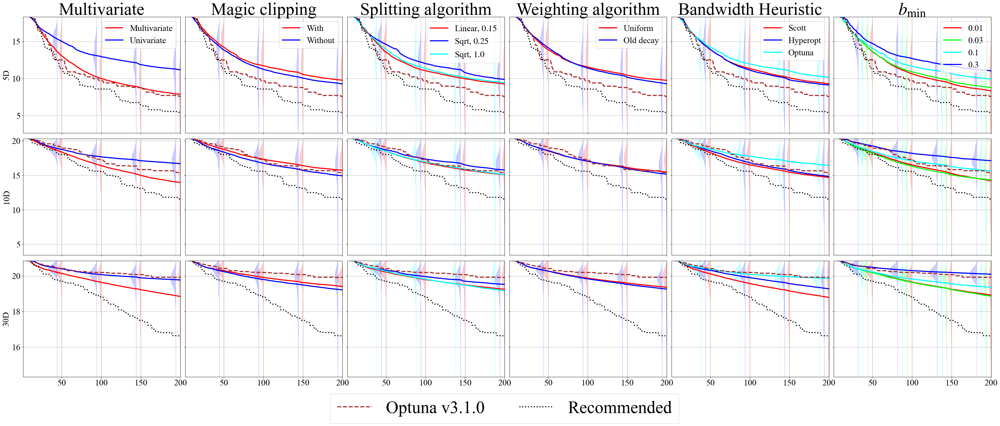

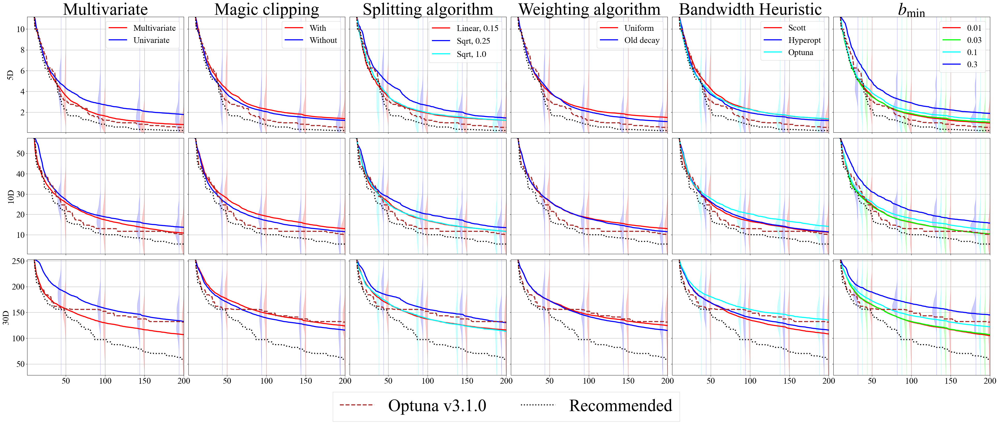

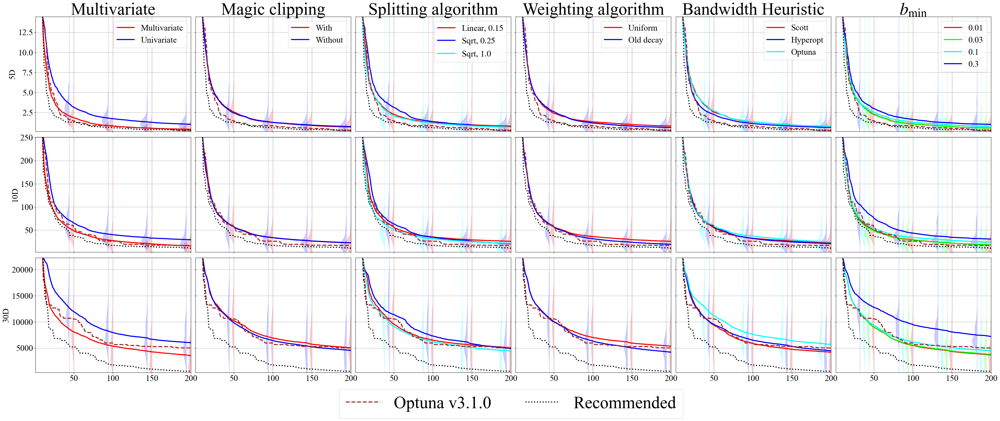

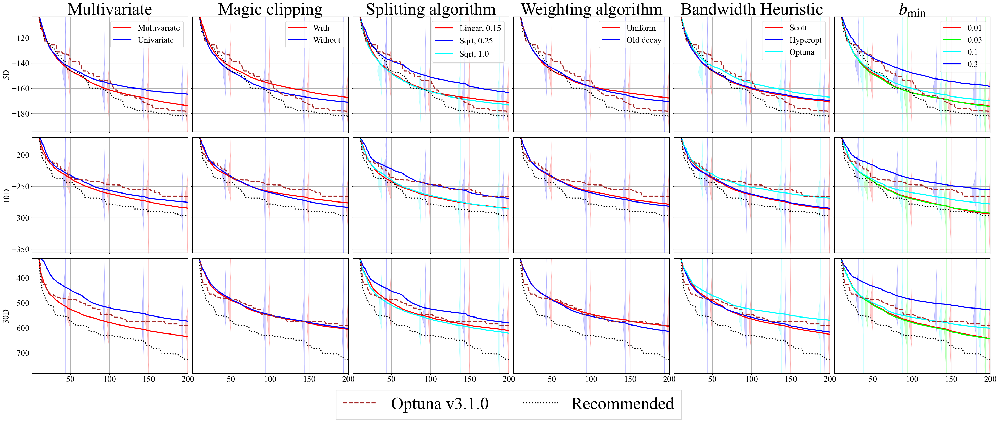

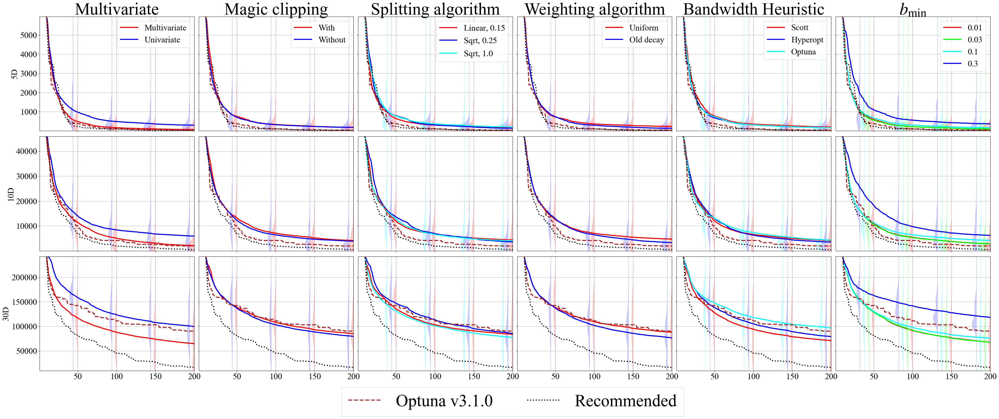

...

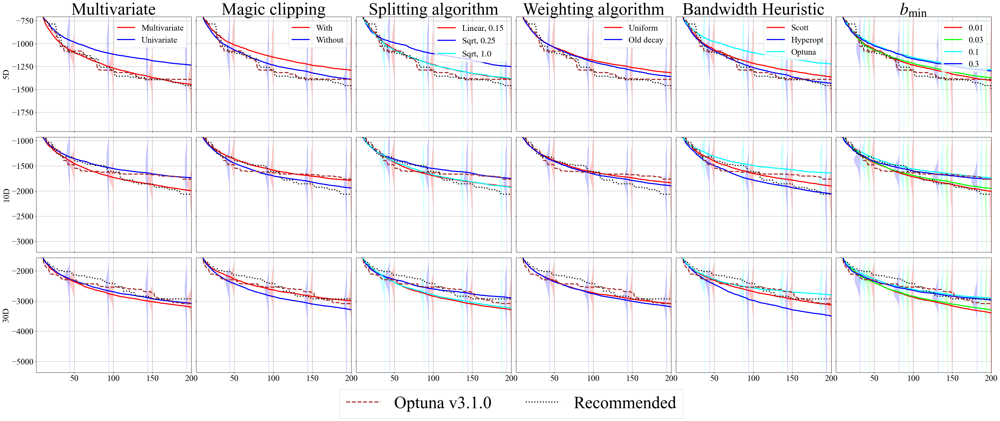

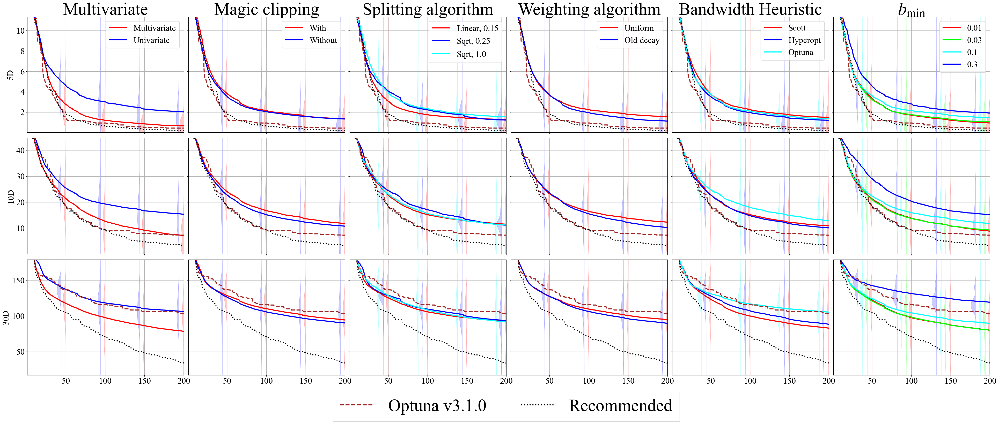

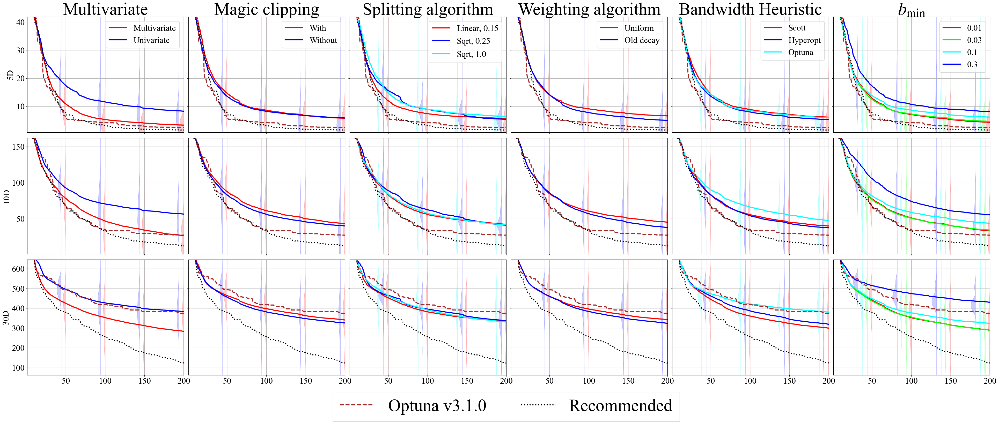

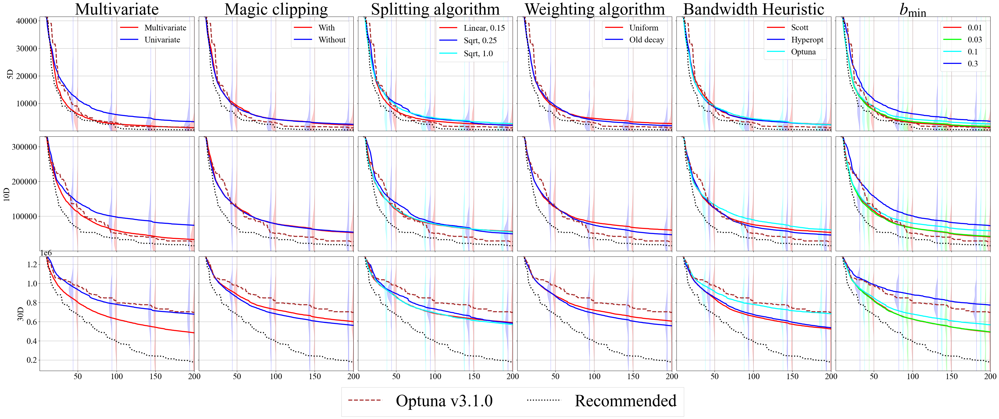

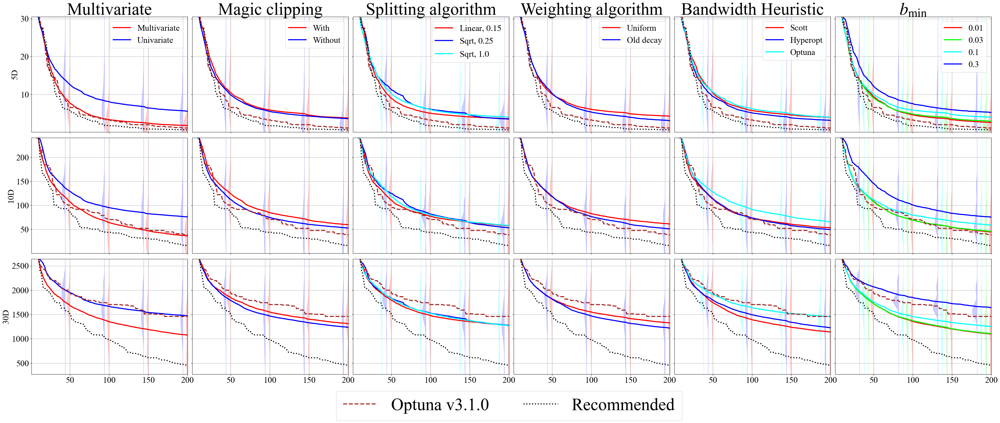

In [7]:
bench_names = list(set([name[:-4] for name in target_names if "30d" in name]))
BENCH_LABEL_DICT = {
    "Ackley": "Ackley",
    "Griewank": "Griewank",
    "KTablet": "K-Tablet",
    "Levy": "Levy",
    "Perm": "Perm",
    "Rastrigin": "Rastrigin",
    "Rosenbrock": "Rosenbrock",
    "Schwefel": "Schwefel",
    "Sphere": "Sphere",
    "Styblinski": "Styblinski",
    "WeightedSphere": "Weighted sphere",
    "XinSheYang": "Xin-She-Yang",
}
print(bench_names)

for bench_name in bench_names:
    title = BENCH_LABEL_DICT[bench_name.split("_")[0]]
    _, axes = plt.subplots(
        nrows=3,
        ncols=6,
        figsize=(48, 18),
        sharex=True,
        sharey="row",
        gridspec_kw=dict(
            wspace=0.03,
            hspace=0.05,
        )
    )
    plot_multiple_pdps(axes[0], target_name=f"{bench_name}_05d", set_title=True, set_label=True)
    axes[0][0].set_ylabel("5D")
    plot_multiple_pdps(axes[1], target_name=f"{bench_name}_10d", set_title=False, set_label=False)
    axes[1][0].set_ylabel("10D")
    plot_multiple_pdps(axes[2], target_name=f"{bench_name}_30d", set_title=False, set_label=False)
    axes[2][0].set_ylabel("30D")
    # plt.show()
    add_optuna_legend(ax=axes[-1][2], bbox_to_anchor=(1.0, -0.07))
    # plt.suptitle(title, x=0.512, y=0.95, ha="center", fontsize=48)
    plt.savefig(f"figs/{bench_name}_bw.pdf", bbox_inches="tight")

## HPOBench

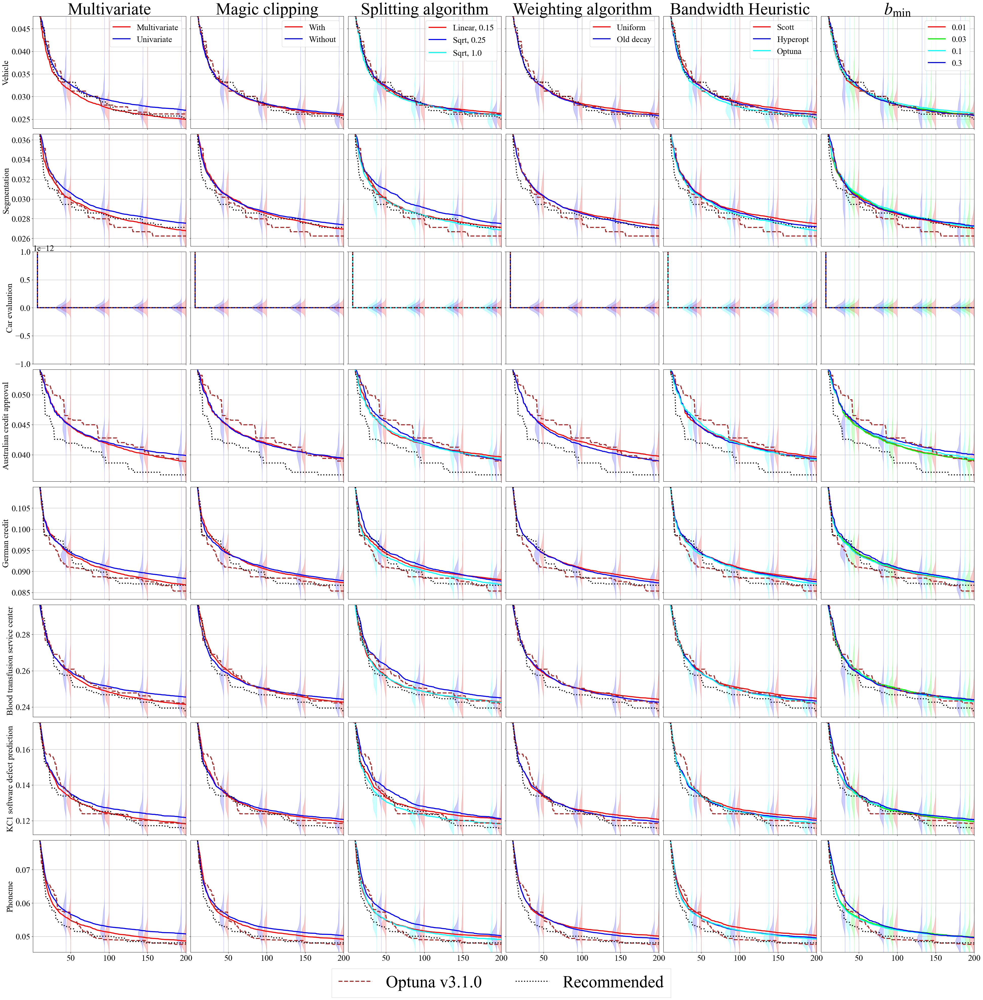

In [8]:
bench_names = [
    "vehicle",
    "segment",
    "car",
    "australian",
    "credit_g",
    "blood_transfusion",
    "kc1",
    "phoneme",
]
_, axes = plt.subplots(
    nrows=8,
    ncols=6,
    figsize=(48, 48),
    sharex=True,
    sharey="row",
    gridspec_kw=dict(
        wspace=0.03,
        hspace=0.05,
    )
)

label_dict = {
    "credit_g": "German credit",
    "vehicle": "Vehicle",
    "segment": "Segmentation",
    "car": "Car evaluation",
    "australian": "Australian credit approval",
    "blood_transfusion": "Blood transfusion service center",
    "kc1": "KC1 software defect prediction",
    "phoneme": "Phoneme",
}
set_title, set_label = True, True
for bench_name, ax in zip(bench_names, axes):
    ax[0].set_ylabel(label_dict[bench_name])
    plot_multiple_pdps(ax, target_name=bench_name, set_title=set_title, set_label=set_label)
    # plt.show()
    set_title, set_label = False, False

add_optuna_legend(ax=axes[-1][2], bbox_to_anchor=(1.0, -0.07))
# plt.suptitle("HPOBench", x=0.512, y=0.905, fontsize=48)
plt.savefig(f"figs/hpobench_bw.pdf", bbox_inches="tight")

## HPOlib

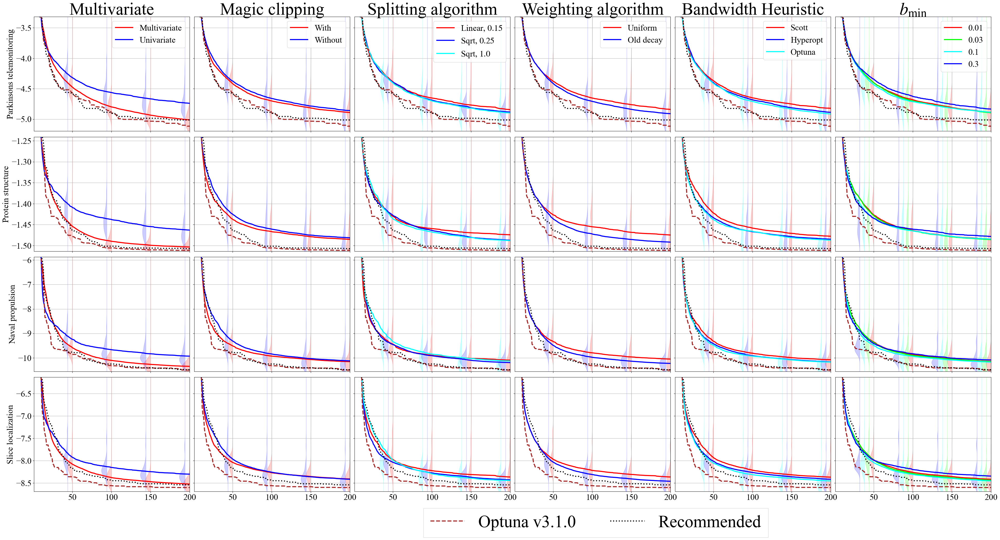

In [9]:
bench_names = ["parkinsons_telemonitoring", "protein_structure", "naval_propulsion", "slice_localization"]
_, axes = plt.subplots(
    nrows=4,
    ncols=6,
    figsize=(48, 24),
    sharex=True,
    sharey="row",
    gridspec_kw=dict(
        wspace=0.03,
        hspace=0.05,
    )
)

set_title, set_label = True, True
label_dict = {
    "parkinsons_telemonitoring": "Parkinsons telemonitoring",
    "naval_propulsion": "Naval propulsion",
    "slice_localization": "Slice localization",
    "protein_structure": "Protein structure"
}
for bench_name, ax in zip(bench_names, axes):
    ax[0].set_ylabel(label_dict[bench_name])
    plot_multiple_pdps(ax, target_name=bench_name, set_title=set_title, set_label=set_label)
    # plt.show()
    set_title, set_label = False, False

add_optuna_legend(ax=axes[-1][2], bbox_to_anchor=(1.55, -0.07))
# plt.suptitle("HPOlib", x=0.515, y=0.93, fontsize=48)
plt.savefig(f"figs/hpolib_bw.pdf", bbox_inches="tight")

## JAHS-Bench-201

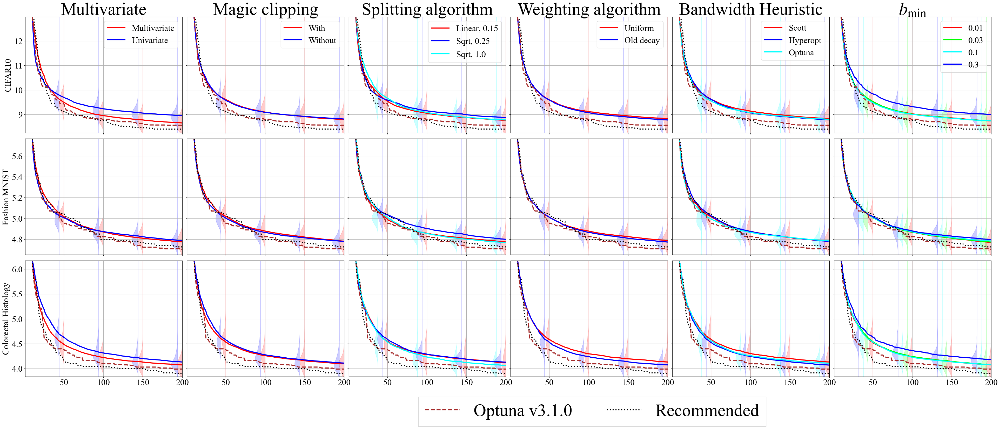

In [10]:
bench_names = ["cifar10", "fashion_mnist", "colorectal_histology"]
_, axes = plt.subplots(
    nrows=3,
    ncols=6,
    figsize=(48, 18),
    sharex=True,
    sharey="row",
    gridspec_kw=dict(
        wspace=0.03,
        hspace=0.05,
    )
)

set_title, set_label = True, True
label_dict = {
    "cifar10": "CIFAR10",
    "fashion_mnist": "Fashion MNIST",
    "colorectal_histology": "Colorectal Histology"
}
for bench_name, ax in zip(bench_names, axes):
    ax[0].set_ylabel(label_dict[bench_name])
    plot_multiple_pdps(ax, target_name=bench_name, set_title=set_title, set_label=set_label)
    # plt.show()
    set_title, set_label = False, False

add_optuna_legend(ax=axes[-1][2], bbox_to_anchor=(1.55, -0.1))
# plt.suptitle("JAHS-Bench-201", x=0.513, y=0.95, fontsize=48)
plt.savefig(f"figs/jahs_bw.pdf", bbox_inches="tight")